# Experiment (6/6)

This notebook will solve the following problem:
+ We started by testing some basic preprocessing to see if the models achieved good results, based on the assumption that bad models will always produce worse results than good models, even with basic preprocessing methods.

Now that we have found good models for the binary and multiclass classification problems, we can test if different preprocessing/data augmentation techniques lead to better results than just using the normal images.

The following process will be performed:
+ See the result of some preprocessing techniques on the images.
+ Find the best preprocessing configuration for the best models found for binary and multiclass classification.
+ Evaluate on the validation and test data.
+ Conclude about the final models.

## Imports

In [1]:
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# data visualisation and manipulation
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd 
import pickle

#model selection
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import ParameterGrid

#dl libraraies
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import L1L2

# specifically for cnn
from keras.layers import Dense, Input, Dropout, Flatten, Conv2D, MaxPooling2D, concatenate

import tensorflow as tf

# tools
import cv2
from tqdm import tqdm
from keras.utils import load_img
from PIL import ImageOps, Image
import os
from tensorflow.keras.applications import DenseNet201
%load_ext autoreload
%autoreload 2
from utils.tools import evaluate_model_train, evaluate_model_predictions, inception_module

In [2]:
os.getcwd()

'c:\\Users\\luisb\\OneDrive\\Documentos\\uni\\Year 3\\Semester 1\\Deep learning\\project\\DL_project\\Notebooks'

## Data

We load the necessary data to train and test the model, we will use the hold-out method in this case.

In [3]:
%cd ..

# labels
with open('./Data_Images/Ylabels_Bi_MC.pkl', 'rb') as file:  
    y_binary_labels, y_multiclass_labels = pickle.load(file)

# train
with open('./Data_Images/Train_HP_img_yEncode_Bi_MC_Mag.pkl', 'rb') as file:  
    X_train_hp_a, y_binary_train_hp, y_multiclass_train_hp, Mag_train_hp = pickle.load(file)

# validaton
with open('./Data_Images/Val_HP_img_yEncode_Bi_MC_Mag.pkl', 'rb') as file:  
    X_val_hp_a, y_binary_val_hp, y_multiclass_val_hp, Mag_val_hp = pickle.load(file)

# test
with open('./Data_Images/Test_img_yEncode_Bi_MC_Mag.pkl', 'rb') as file:  
    X_test_a, y_binary_test, y_multiclass_test, Mag_test = pickle.load(file)

# label encoder
with open('./Data_Images/LabelEncoder_Bi_MC.pkl', 'rb') as file:  
     label_encoder_binary, label_encoder_multiclass= pickle.load(file)

c:\Users\luisb\OneDrive\Documentos\uni\Year 3\Semester 1\Deep learning\project\DL_project


In [4]:
shape_input = X_train_hp_a.shape[1:]
shape_input

(150, 150, 3)

In [5]:
shape_mag = Mag_train_hp.shape[1:]
shape_mag

(4,)

In [6]:
class_weights_Bi = compute_class_weight('balanced', classes=np.unique(y_binary_labels), y=y_binary_labels)
class_weights_dict_Bi = {int(key):val for key, val in zip(label_encoder_binary.transform(np.unique(y_binary_labels)),class_weights_Bi)}
class_weights_dict_Bi

{0: np.float64(1.5945564516129032), 1: np.float64(0.7284030208141462)}

In [7]:
sample_weight_train_hp_Bi = np.array(list(map(class_weights_dict_Bi.get, np.argmax(y_binary_train_hp, axis=1))))
sample_weight_train_hp_Bi[:10]

array([0.72840302, 0.72840302, 0.72840302, 0.72840302, 1.59455645,
       0.72840302, 0.72840302, 0.72840302, 1.59455645, 1.59455645])

In [8]:
class_weights_MC = compute_class_weight('balanced', classes=np.unique(y_multiclass_labels), y=y_multiclass_labels)
class_weights_dict_MC = {int(key):val for key, val in zip(label_encoder_multiclass.transform(np.unique(y_multiclass_labels)),class_weights_MC)}
class_weights_dict_MC

{0: np.float64(2.2266328828828827),
 1: np.float64(0.2864749348015068),
 2: np.float64(0.9749753451676528),
 3: np.float64(1.579273162939297),
 4: np.float64(1.2482638888888888),
 5: np.float64(1.7654017857142856),
 6: np.float64(2.1823951434878586),
 7: np.float64(1.7374780316344465)}

In [9]:
sample_weight_train_hp_MC = np.array(list(map(class_weights_dict_MC.get, np.argmax(y_multiclass_train_hp, axis=1))))
sample_weight_train_hp_MC[:10]

array([0.28647493, 0.28647493, 0.28647493, 1.57927316, 0.97497535,
       0.28647493, 0.28647493, 1.76540179, 0.97497535, 2.18239514])

We need a dictionary with the inputs to pass the data to the model correctly.

In [10]:
x_data = {'image' : X_train_hp_a,
            'magnitude' : Mag_train_hp}

val_data_dic_in = {'image' : X_val_hp_a,
                    'magnitude' : Mag_val_hp}

In [11]:
tf.random.set_seed(23)

## Data Augmentation

All the techniques and preprocessing that we are going to test are to maximize the difference between classes, increasing the contrast and brightness of images, since we see that different cancer types have different colors and pixel distribution, all to see if we can improve the results. Of course, all the transformations that we are going to do are going to be made to the train, validation and test data.

In [ ]:
data = pd.read_csv("image_data_clean.csv")
group = data.groupby(['Cancer Type']).first().reset_index()
%cd ..
group

c:\Users\luisb\OneDrive\Documentos\uni\Year 3\Semester 1\Deep learning\project


,Cancer Type,path_to_image,Benign or Malignant,Image_folder,Magnification
0,adenosis,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,SOB_B_A_14-22549AB,100X
1,ductal_carcinoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,malignant,SOB_M_DC_14-10926,100X
2,fibroadenoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,SOB_B_F_14-14134,100X
3,lobular_carcinoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,malignant,SOB_M_LC_14-12204,100X
4,mucinous_carcinoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,malignant,SOB_M_MC_14-10147,100X
5,papillary_carcinoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,malignant,SOB_M_PC_14-12465,100X
6,phyllodes_tumor,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,SOB_B_PT_14-21998AB,100X
7,tubular_adenoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,SOB_B_TA_14-13200,100X


### PIL autocontrast
The first method we will try is autocontrast from the ImageOps module of PIL. This method maximizes or normalizes image contrast. A detailed description of the transformations this method performs can be found at <a href="https://pillow-wiredfool.readthedocs.io/en/latest/reference/ImageOps.html"> PIL ImageOps module </a>. The image was generated in the Preprocessing notebook.

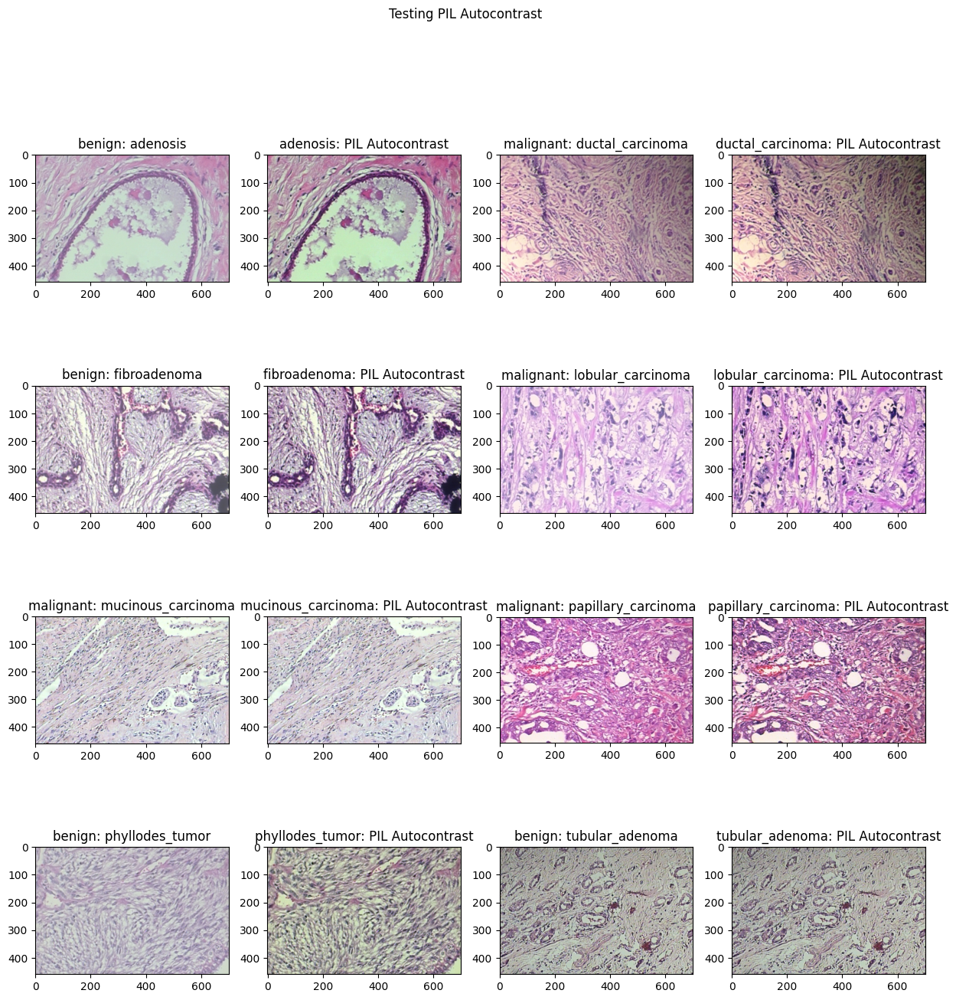

In [13]:
fig, ax = plt.subplots(4,4, figsize=(15, 15))
fig.suptitle('Testing PIL Autocontrast')
ax = ax.flatten()
index = 0
for i, img in group.iterrows():

    img_l = load_img(img.path_to_image)
    ax[index].imshow(img_l)
    ax[index].set_title(f'{img['Benign or Malignant']}: {img['Cancer Type']}')
    index+=1
    img_cont = ImageOps.autocontrast(img_l)
    ax[index].imshow(img_cont)
    ax[index].set_title(f'{img['Cancer Type']}: PIL Autocontrast')
    index+=1
    
plt.show()

### CV2 Contrast and brightness

The next test we will perform will involve testing the extremes of the alpha (contrast) and beta (brightness) values on the convertScaleAbs method from CV2 to see the impact of contrast and brightness transformations on our images. A more detailed explanation of the method can be found at <a href="https://docs.opencv.org/4.x/d3/dc1/tutorial_basic_linear_transform.html"> Changing the contrast and brightness of an image in CV2! </a>

We already saw in the Preprocessing notebook that very large values for brightness and contrast (alpha close to 3 or beta close to 100) leads to nearly completely white images with almost no information, because of that we are going to test alpha between 1-1.1 and beta between 0-40.

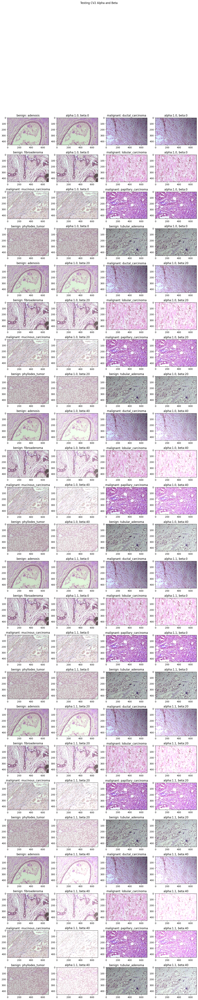

In [ ]:
fig, ax = plt.subplots(24,4, figsize=(15, 70))
fig.suptitle('Testing CV2 Alpha and Beta')
ax = ax.flatten()
index = 0

for alpha in [1.0, 1.10]:
    for beta in [0, 20, 40]:
        for i, img in group.iterrows():
            img_l = cv2.imread(img.path_to_image)
            ax[index].imshow(img_l)
            ax[index].set_title(f'{img['Benign or Malignant']}: {img['Cancer Type']}')
            index+=1
            img_cont = cv2.convertScaleAbs(img_l, alpha=alpha, beta=beta)
            ax[index].imshow(img_cont)
            ax[index].set_title(f'alpha:{alpha}, beta:{beta}')
            index+=1
plt.show()

### Conclusion
After seeing the images, we will test, using a gridsearch:
+ Alpha values of: 1 and 1.1, higher values are not beneficial, that is not shown in the plot above, because it was already very crowded.
+ Beta values of: 0 and 20, because beta 40 already removes too much from the images.
+ With PIL autocontrast and without.

## Binary Model

In [ ]:
param_grid = {'alpha':[1.0, 1.1],
              'beta': [0, 20],
              'pil_autocontrast': [True, False]}

best_params_Bi = None
best_F1_Bi = 0

grid = ParameterGrid(param_grid)
i = 0

for params in tqdm(grid):
    i += 1
    print(f'\nBest Binary val_F1Score so far: {best_F1_Bi}. Parameters: {best_params_Bi}\n')
    print(f'\nTesting: {params}\n')

    X_train = []
    for image in tqdm(X_train_hp_a):
        # denormalize
        img = image*255
        img = cv2.convertScaleAbs(img, alpha=params['alpha'], beta=params['beta'])
        if params['pil_autocontrast']:
            img = Image.fromarray(img)
            img = ImageOps.autocontrast(img)
            img = np.array(img)
        # normalize
        img = img/255
        X_train.append(img)
    X_train = np.array(X_train, dtype=np.float32)

    X_val = []
    for image in tqdm(X_val_hp_a):
        # denormalize
        img = image*255
        img = cv2.convertScaleAbs(img, alpha=params['alpha'], beta=params['beta'])
        if params['pil_autocontrast']:
            img = Image.fromarray(img)
            img = ImageOps.autocontrast(img)
            img = np.array(img)
        # normalize
        img = img/255
        X_val.append(img)
    X_val = np.array(X_val, dtype=np.float32)

    # Binary Model
    print('\nBinary Model:')

    early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    LR_ajust = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=2)
    list_callbacks = [early_stop, LR_ajust]

    # Inputs
    input_tensor = Input(shape=shape_input, name='image')
    input_magnitude = Input(shape=shape_mag, name='magnitude')

    # Conv + Pool
    Conv_3_3 = Conv2D(32, (3,3), activation='relu', name='Conv_3x3_1')(input_tensor)
    Conv_3_3 = Conv2D(32, (3,3), activation='relu', name='Conv_3x3_2')(Conv_3_3)

    Pool_2_2 = MaxPooling2D((2,2), name='Pool_2x2')(Conv_3_3)

    # inception modules
    block_1 = inception_module(Pool_2_2, n_f_1x1=64, n_f_3x3_r =16, n_f_3x3=64, n_f_5x5_r=16, n_f_5x5=64, n_f_1x1_end=64, name='IB1')

    Pool2_2_2 = MaxPooling2D((2,2), name='Pool2_2x2')(block_1)

    # Conv + Pool
    Conv2_3_3 = Conv2D(64, (3,3), activation='relu', name='Conv2_3x3_1')(Pool2_2_2)
    Conv2_3_3 = Conv2D(64, (3,3), activation='relu', name='Conv2_3x3_2')(Conv2_3_3)

    Pool3_2_2 = MaxPooling2D((3,3), name='Pool3_2x2')(Conv2_3_3)

    # Flaten bin
    flat = Flatten(name='Flat')(Pool3_2_2)
    flat = concatenate([flat, input_magnitude], axis=1, name='Flat_Bi')

    # Dense Bi
    Bi_dense = Dense(2048, activation='relu', name='Bi_dense0')(flat)
    Bi_dense = Dropout(0.5, name='Bi_dropout0')(Bi_dense)
    Bi_dense = Dense(1024, activation='relu', name='Bi_dense1')(Bi_dense)
    Bi_dense = Dropout(0.5, name='Bi_dropout1')(Bi_dense)
    Bi_dense = Dense(512, activation='relu', name='Bi_dense3')(Bi_dense)
    Bi_dense = Dropout(0.4, name='Bi_dropout3')(Bi_dense)
    Bi_output = Dense(2, activation='softmax', name='Bi_output')(Bi_dense)


    # build de model
    model_Bi = Model([input_tensor,input_magnitude], Bi_output)

    model_Bi.compile(optimizer='adam',
                        loss='categorical_crossentropy',
                        metrics=['F1Score'])

    x_data = {'image' : X_train,
            'magnitude' : Mag_train_hp}

    val_data_dic_in = {'image' : X_val,
                    'magnitude' : Mag_val_hp}

    history_Bi=model_Bi.fit(x_data, y_binary_train_hp, batch_size= 100, epochs=50, callbacks=list_callbacks,
                            validation_data=[val_data_dic_in, y_binary_val_hp], sample_weight=sample_weight_train_hp_Bi)
    Bi_model_F1 = np.max(np.mean(history_Bi.history['val_F1Score'], axis=1))
    if Bi_model_F1 > best_F1_Bi:
        best_F1_Bi = Bi_model_F1
        best_params_Bi = params

    del X_train, X_val , history_Bi , model_Bi

  0%|          | 0/8 [00:00<?, ?it/s]


Best Binary val_F1Score so far: 0. Parameters: None


Testing: {'alpha': 1.0, 'beta': 0, 'pil_autocontrast': True}




100%|██████████| 5061/5061 [00:07<00:00, 663.01it/s]

100%|██████████| 1266/1266 [00:01<00:00, 1165.09it/s]



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 71s 905ms/step - F1Score: 0.4709 - loss: 0.7172 - val_F1Score: 0.5867 - val_loss: 0.6171 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 26s 197ms/step - F1Score: 0.6006 - loss: 0.6250 - val_F1Score: 0.5315 - val_loss: 0.7583 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 10s 200ms/step - F1Score: 0.6125 - loss: 0.6304 - val_F1Score: 0.6167 - val_loss: 0.6473 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 10s 203ms/step - F1Score: 0.6381 - loss: 0.5907 - val_F1Score: 0.7135 - val_loss: 0.5147 - learning_rate: 1.0000e-04
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 216ms/step - F1Score: 0.6749 - loss: 0.5709 - val_F1Score: 0.7157 - val_loss: 0.4999 - learning_rate: 1.0000e-04
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 209ms/step - F1Score: 0.6766 - loss: 0.5688 - val_F1Score: 0.7211 - val_loss: 0.4950 - learning_rate: 1.0000e-04
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - F1Score: 0.6

 12%|█▎        | 1/8 [05:09<36:07, 309.65s/it]


Best Binary val_F1Score so far: 0.7303235530853271. Parameters: {'alpha': 1.0, 'beta': 0, 'pil_autocontrast': True}


Testing: {'alpha': 1.0, 'beta': 0, 'pil_autocontrast': False}




100%|██████████| 5061/5061 [00:02<00:00, 2315.74it/s]

100%|██████████| 1266/1266 [00:00<00:00, 3172.32it/s]



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 23s 308ms/step - F1Score: 0.4962 - loss: 0.7195 - val_F1Score: 0.6685 - val_loss: 0.5736 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 223ms/step - F1Score: 0.6993 - loss: 0.5692 - val_F1Score: 0.8264 - val_loss: 0.4348 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - F1Score: 0.7959 - loss: 0.4994 - val_F1Score: 0.8579 - val_loss: 0.3559 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 19s 206ms/step - F1Score: 0.7990 - loss: 0.4774 - val_F1Score: 0.8604 - val_loss: 0.3551 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - F1Score: 0.8128 - loss: 0.4637 - val_F1Score: 0.8658 - val_loss: 0.3364 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 208ms/step - F1Score: 0.8178 - loss: 0.4571 - val_F1Score: 0.8646 - val_loss: 0.3330 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 209ms/step - F1Score: 0.8190 - loss: 

 25%|██▌       | 2/8 [09:16<27:17, 272.92s/it]


Best Binary val_F1Score so far: 0.881919801235199. Parameters: {'alpha': 1.0, 'beta': 0, 'pil_autocontrast': False}


Testing: {'alpha': 1.0, 'beta': 20, 'pil_autocontrast': True}




100%|██████████| 5061/5061 [00:05<00:00, 865.39it/s]

100%|██████████| 1266/1266 [00:01<00:00, 858.87it/s] 



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 23s 317ms/step - F1Score: 0.4762 - loss: 0.6936 - val_F1Score: 0.4263 - val_loss: 0.7925 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - F1Score: 0.5795 - loss: 0.6373 - val_F1Score: 0.7293 - val_loss: 0.5557 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 206ms/step - F1Score: 0.6947 - loss: 0.5699 - val_F1Score: 0.7404 - val_loss: 0.5249 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 203ms/step - F1Score: 0.7128 - loss: 0.5588 - val_F1Score: 0.7052 - val_loss: 0.6967 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 207ms/step - F1Score: 0.7342 - loss: 0.5429 - val_F1Score: 0.7868 - val_loss: 0.4320 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 218ms/step - F1Score: 0.7412 - loss: 0.5300 - val_F1Score: 0.7791 - val_loss: 0.4760 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - F1Score: 0.7302 - loss: 

 38%|███▊      | 3/8 [14:09<23:30, 282.15s/it]


Best Binary val_F1Score so far: 0.881919801235199. Parameters: {'alpha': 1.0, 'beta': 0, 'pil_autocontrast': False}


Testing: {'alpha': 1.0, 'beta': 20, 'pil_autocontrast': False}




100%|██████████| 5061/5061 [00:02<00:00, 2177.24it/s]

100%|██████████| 1266/1266 [00:00<00:00, 3476.51it/s]



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 26s 334ms/step - F1Score: 0.4574 - loss: 0.7247 - val_F1Score: 0.4073 - val_loss: 0.6776 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 30s 208ms/step - F1Score: 0.5203 - loss: 0.6949 - val_F1Score: 0.7808 - val_loss: 0.5167 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 209ms/step - F1Score: 0.7492 - loss: 0.5460 - val_F1Score: 0.6336 - val_loss: 0.6792 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - F1Score: 0.7566 - loss: 0.5176 - val_F1Score: 0.6633 - val_loss: 0.7187 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 207ms/step - F1Score: 0.7672 - loss: 0.5062 - val_F1Score: 0.8530 - val_loss: 0.3686 - learning_rate: 1.0000e-04
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 203ms/step - F1Score: 0.8127 - loss: 0.4521 - val_F1Score: 0.8557 - val_loss: 0.3587 - learning_rate: 1.0000e-04
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 207ms/step - F1Score: 0.8156 

 50%|█████     | 4/8 [22:58<25:17, 379.31s/it]


Best Binary val_F1Score so far: 0.895840048789978. Parameters: {'alpha': 1.0, 'beta': 20, 'pil_autocontrast': False}


Testing: {'alpha': 1.1, 'beta': 0, 'pil_autocontrast': True}




100%|██████████| 5061/5061 [00:06<00:00, 747.79it/s]

100%|██████████| 1266/1266 [00:01<00:00, 1156.69it/s]



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 27s 359ms/step - F1Score: 0.5058 - loss: 0.7664 - val_F1Score: 0.7848 - val_loss: 0.5273 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 29s 209ms/step - F1Score: 0.7199 - loss: 0.5690 - val_F1Score: 0.8041 - val_loss: 0.4875 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - F1Score: 0.7409 - loss: 0.5356 - val_F1Score: 0.6472 - val_loss: 0.6749 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 209ms/step - F1Score: 0.7255 - loss: 0.5423 - val_F1Score: 0.7934 - val_loss: 0.4701 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - F1Score: 0.7740 - loss: 0.4948 - val_F1Score: 0.7978 - val_loss: 0.4702 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - F1Score: 0.7767 - loss: 0.5064 - val_F1Score: 0.7468 - val_loss: 0.5714 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 208ms/step - F1Score: 0.7878 - loss: 

 62%|██████▎   | 5/8 [36:06<26:20, 526.71s/it]


Best Binary val_F1Score so far: 0.895840048789978. Parameters: {'alpha': 1.0, 'beta': 20, 'pil_autocontrast': False}


Testing: {'alpha': 1.1, 'beta': 0, 'pil_autocontrast': False}




100%|██████████| 5061/5061 [00:02<00:00, 1849.43it/s]

100%|██████████| 1266/1266 [00:00<00:00, 4007.24it/s]



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 24s 321ms/step - F1Score: 0.5556 - loss: 0.6659 - val_F1Score: 0.7721 - val_loss: 0.4968 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - F1Score: 0.7736 - loss: 0.5077 - val_F1Score: 0.8078 - val_loss: 0.4641 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 223ms/step - F1Score: 0.7965 - loss: 0.4774 - val_F1Score: 0.7203 - val_loss: 0.6236 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 219ms/step - F1Score: 0.7706 - loss: 0.5083 - val_F1Score: 0.8602 - val_loss: 0.3450 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 206ms/step - F1Score: 0.8171 - loss: 0.4440 - val_F1Score: 0.8549 - val_loss: 0.4010 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 208ms/step - F1Score: 0.8082 - loss: 0.4521 - val_F1Score: 0.8656 - val_loss: 0.3329 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 206ms/step - F1Score: 0.8189 - loss: 

 75%|███████▌  | 6/8 [43:23<16:32, 496.16s/it]


Best Binary val_F1Score so far: 0.895840048789978. Parameters: {'alpha': 1.0, 'beta': 20, 'pil_autocontrast': False}


Testing: {'alpha': 1.1, 'beta': 20, 'pil_autocontrast': True}




100%|██████████| 5061/5061 [00:05<00:00, 868.39it/s]

100%|██████████| 1266/1266 [00:01<00:00, 1115.23it/s]



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 24s 314ms/step - F1Score: 0.5405 - loss: 0.6879 - val_F1Score: 0.6816 - val_loss: 0.7272 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - F1Score: 0.7103 - loss: 0.5690 - val_F1Score: 0.5095 - val_loss: 0.7735 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 220ms/step - F1Score: 0.7086 - loss: 0.5358 - val_F1Score: 0.8019 - val_loss: 0.5098 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 206ms/step - F1Score: 0.7639 - loss: 0.5027 - val_F1Score: 0.8202 - val_loss: 0.4181 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 209ms/step - F1Score: 0.7630 - loss: 0.4789 - val_F1Score: 0.7763 - val_loss: 0.5201 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 223ms/step - F1Score: 0.7761 - loss: 0.4781 - val_F1Score: 0.8312 - val_loss: 0.3994 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - F1Score: 0.7804 - loss: 

 88%|████████▊ | 7/8 [50:03<07:44, 464.80s/it]


Best Binary val_F1Score so far: 0.895840048789978. Parameters: {'alpha': 1.0, 'beta': 20, 'pil_autocontrast': False}


Testing: {'alpha': 1.1, 'beta': 20, 'pil_autocontrast': False}




100%|██████████| 5061/5061 [00:02<00:00, 2446.53it/s]

100%|██████████| 1266/1266 [00:00<00:00, 3727.40it/s]



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 23s 326ms/step - F1Score: 0.4869 - loss: 0.7016 - val_F1Score: 0.7231 - val_loss: 0.6460 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 208ms/step - F1Score: 0.7577 - loss: 0.5277 - val_F1Score: 0.6959 - val_loss: 0.7041 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - F1Score: 0.7563 - loss: 0.5320 - val_F1Score: 0.6951 - val_loss: 0.6361 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 219ms/step - F1Score: 0.7502 - loss: 0.5252 - val_F1Score: 0.7403 - val_loss: 0.4845 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - F1Score: 0.7649 - loss: 0.4983 - val_F1Score: 0.7638 - val_loss: 0.4795 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 207ms/step - F1Score: 0.7931 - loss: 0.4788 - val_F1Score: 0.7529 - val_loss: 0.4967 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - F1Score: 0.7813 - loss: 

100%|██████████| 8/8 [53:40<00:00, 402.57s/it]


In [ ]:
print('Binary Model')
print(f'Best F1 score in validation: {best_F1_Bi}')
print(f'Best parameters: {best_params_Bi}')

Binary Model
Best F1 score in validation: 0.895840048789978
Best parameters: {'alpha': 1.0, 'beta': 20, 'pil_autocontrast': False}


Now we will transform the data with the best combination of preprocessing parameters.

In [ ]:
X_train = []
for image in tqdm(X_train_hp_a):
    # denormalize
    img = image*255
    img = cv2.convertScaleAbs(img, alpha=1.0, beta=20)
    img = img/255
    X_train.append(img)
X_train_hp_a = np.array(X_train, dtype=np.float32)

X_val = []
for image in tqdm(X_val_hp_a):
    # denormalize
    img = image*255
    img = cv2.convertScaleAbs(img, alpha=1.0, beta=20)
    # normalize
    img = img/255
    X_val.append(img)
X_val_hp_a = np.array(X_val, dtype=np.float32)

X_test = []
for image in tqdm(X_test_a):
    # denormalize
    img = image*255
    img = cv2.convertScaleAbs(img, alpha=1.0, beta=20)
    # normalize
    img = img/255
    X_test.append(img)
X_test_a = np.array(X_test, dtype=np.float32)

In [ ]:
mean_chanel = []
mean_overal = []
median_chanel = []
median_overal = []

for image in tqdm(X_train_hp_a):
    
    mean_overal.append(np.mean(image))
    median_overal.append(np.median(image))
    mean_chanel.append(np.mean(image, axis= tuple(range(image.ndim-1))))
    median_chanel.append(np.median(image, axis= tuple(range(image.ndim-1))))

mean_overal = np.array(mean_overal)
median_overal = np.array(median_overal)
mean_chanel = np.array(mean_chanel)
median_chanel = np.array(median_chanel)

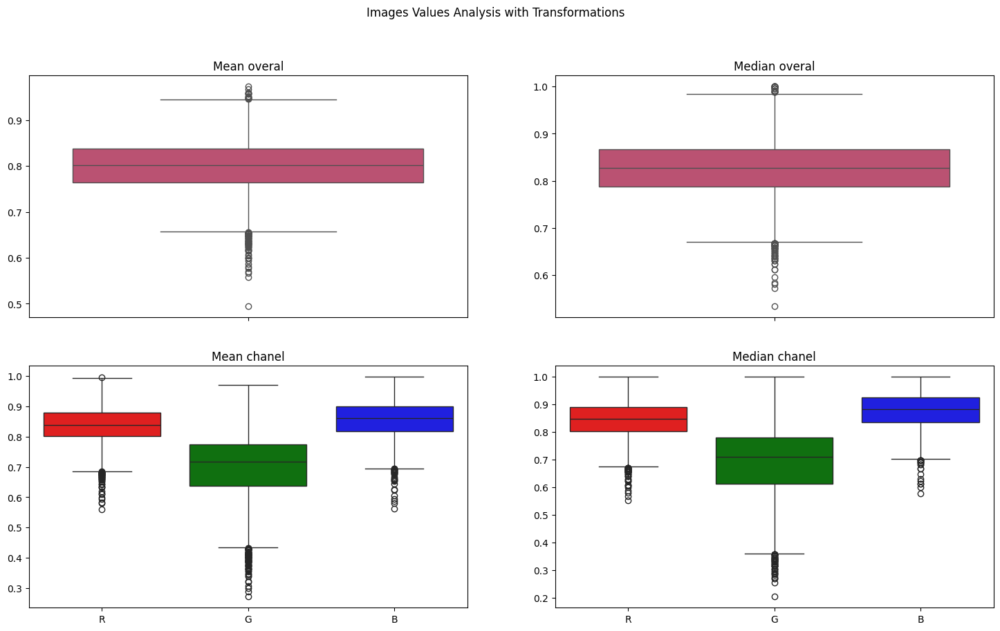

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

fig.suptitle('Images Values Analysis with Transformations')
sns.boxplot(data=mean_overal, ax = axes[0,0], palette=["#cb416b"])
axes[0,0].set_title('Mean overal')
sns.boxplot(data=median_overal, ax = axes[0,1], palette=["#cb416b"])
axes[0,1].set_title('Median overal')
sns.boxplot(data=mean_chanel, ax = axes[1,0], palette=["red","green","blue"])
axes[1,0].set_title('Mean chanel')
axes[1,0].set_xticklabels(['R','G','B'])

sns.boxplot(data=median_chanel,  ax = axes[1,1], palette=["red","green","blue"])
axes[1,1].set_title('Median chanel')
axes[1,1].set_xticklabels(['R','G','B'])

plt.show()

It has almost the same distribution as the original images, only with less outliers on the higher pixels.

In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
LR_ajust = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=2)
list_callbacks = [early_stop, LR_ajust]

# Inputs
input_tensor = Input(shape=shape_input, name='image')
input_magnitude = Input(shape=shape_mag, name='magnitude')

# Conv + Pool
Conv_3_3 = Conv2D(32, (3,3), activation='relu', name='Conv_3x3_1')(input_tensor)
Conv_3_3 = Conv2D(32, (3,3), activation='relu', name='Conv_3x3_2')(Conv_3_3)

Pool_2_2 = MaxPooling2D((2,2), name='Pool_2x2')(Conv_3_3)

# inception modules
block_1 = inception_module(Pool_2_2, n_f_1x1=64, n_f_3x3_r =16, n_f_3x3=64, n_f_5x5_r=16, n_f_5x5=64, n_f_1x1_end=64, name='IB1')

Pool2_2_2 = MaxPooling2D((2,2), name='Pool2_2x2')(block_1)

# Conv + Pool
Conv2_3_3 = Conv2D(64, (3,3), activation='relu', name='Conv2_3x3_1')(Pool2_2_2)
Conv2_3_3 = Conv2D(64, (3,3), activation='relu', name='Conv2_3x3_2')(Conv2_3_3)

Pool3_2_2 = MaxPooling2D((3,3), name='Pool3_2x2')(Conv2_3_3)

# Flaten bin
flat = Flatten(name='Flat')(Pool3_2_2)
flat = concatenate([flat, input_magnitude], axis=1, name='Flat_Bi')

# Dense Bi
Bi_dense = Dense(2048, activation='relu', name='Bi_dense0')(flat)
Bi_dense = Dropout(0.5, name='Bi_dropout0')(Bi_dense)
Bi_dense = Dense(1024, activation='relu', name='Bi_dense1')(Bi_dense)
Bi_dense = Dropout(0.5, name='Bi_dropout1')(Bi_dense)
Bi_dense = Dense(512, activation='relu', name='Bi_dense3')(Bi_dense)
Bi_dense = Dropout(0.4, name='Bi_dropout3')(Bi_dense)
Bi_output = Dense(2, activation='softmax', name='Bi_output')(Bi_dense)


# build de model
model_Bi = Model([input_tensor,input_magnitude], Bi_output)

model_Bi.compile(optimizer='adam',
                        loss='categorical_crossentropy',
                        metrics=['F1Score'])

x_data = {'image' : X_train_hp_a,
        'magnitude' : Mag_train_hp}

val_data_dic_in = {'image' : X_val_hp_a,
                   'magnitude' : Mag_val_hp}


history_Bi=model_Bi.fit(x_data, y_binary_train_hp, batch_size= 100, epochs=50, callbacks=list_callbacks,
                        validation_data=[val_data_dic_in, y_binary_val_hp], sample_weight=sample_weight_train_hp_Bi)

Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 71s 799ms/step - F1Score: 0.5085 - loss: 0.8279 - val_F1Score: 0.7791 - val_loss: 0.4578 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 28s 209ms/step - F1Score: 0.7099 - loss: 0.5869 - val_F1Score: 0.6411 - val_loss: 0.7009 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - F1Score: 0.7530 - loss: 0.5297 - val_F1Score: 0.6435 - val_loss: 0.7006 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 218ms/step - F1Score: 0.7524 - loss: 0.5188 - val_F1Score: 0.8409 - val_loss: 0.3810 - learning_rate: 1.0000e-04
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - F1Score: 0.7951 - loss: 0.4753 - val_F1Score: 0.8366 - val_loss: 0.3743 - learning_rate: 1.0000e-04
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - F1Score: 0.7930 - loss: 0.4781 - val_F1Score: 0.8382 - val_loss: 0.3741 - learning_rate: 1.0000e-04
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - F1Score: 0.7956 - loss: 0.4

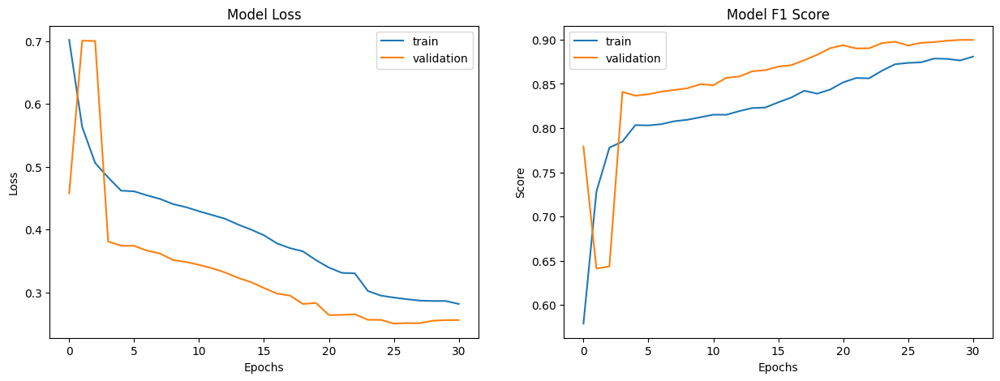

In [ ]:
evaluate_model_train(history_Bi)

40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step
              precision    recall  f1-score   support

      benign       0.84      0.87      0.85       396
   malignant       0.94      0.93      0.93       870

    accuracy                           0.91      1266
   macro avg       0.89      0.90      0.89      1266
weighted avg       0.91      0.91      0.91      1266



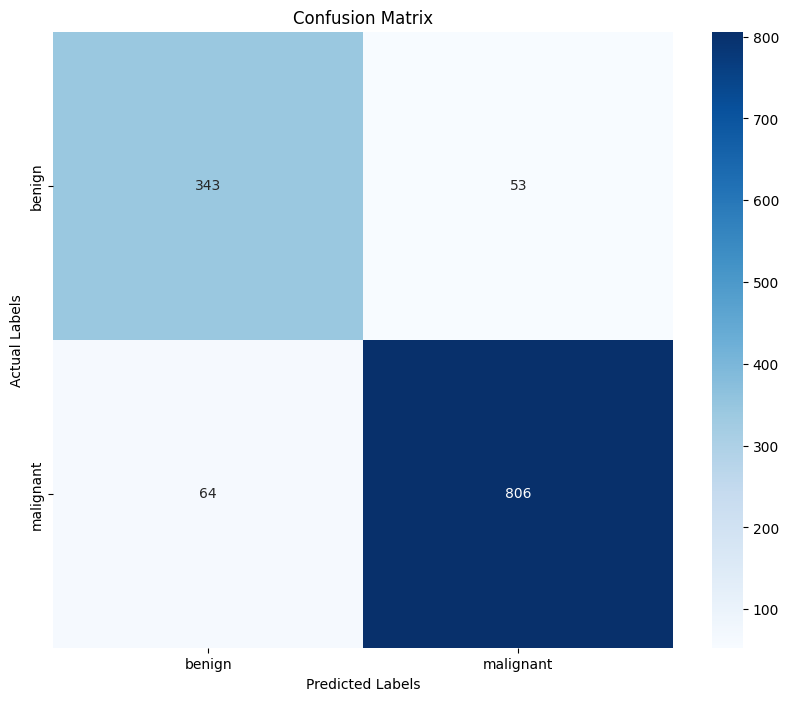

In [ ]:
evaluate_model_predictions(model=model_Bi,
                           X_array=val_data_dic_in,
                           y_array_1=y_binary_val_hp,
                           y_label_1=y_binary_labels,
                           problem_type='single')

With the preprocessing we achieve an F1 score on validation of 0.89. Not passing the best one so far of 0.91 F1 score.

In [ ]:
X_test_data = {"image": X_test_a,
               "magnitude": Mag_test}

50/50 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step
              precision    recall  f1-score   support

      benign       0.82      0.84      0.83       496
   malignant       0.93      0.92      0.92      1086

    accuracy                           0.90      1582
   macro avg       0.88      0.88      0.88      1582
weighted avg       0.90      0.90      0.90      1582



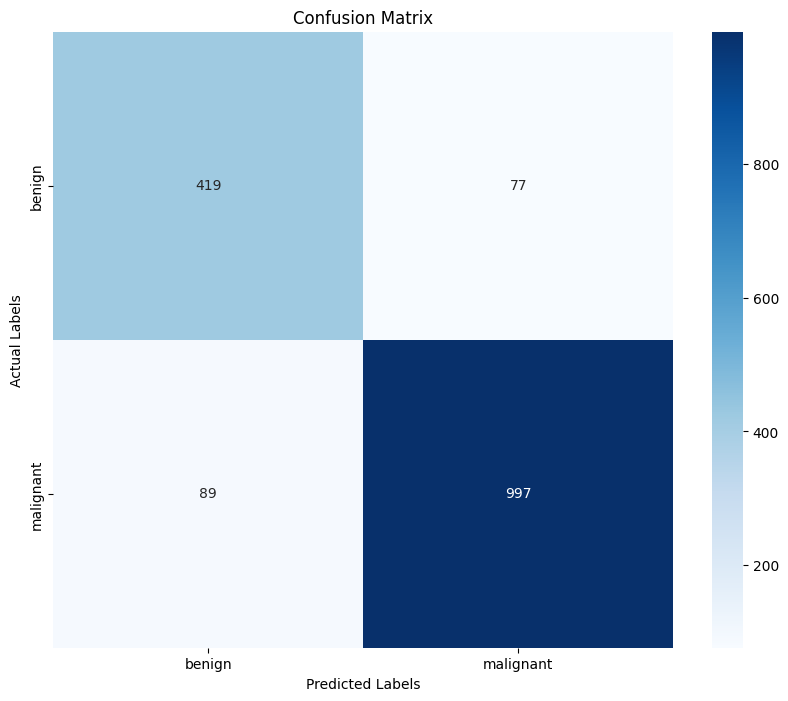

In [ ]:
evaluate_model_predictions(model=model_Bi,
                           X_array=X_test_data,
                           y_array_1=y_binary_test,
                           y_label_1=y_binary_labels,
                           problem_type='single')

Now on the test set, we achieve an F1 score of 0.88. Not passing the best so far of 0.89 F1 score.

## Multiclass Model

The code bellow requires too much memory and resources to run, we weren’t able to run it, because of that we will use the same preprocessing that we found on the binary model.

In [ ]:
param_grid = {'alpha':[1.0, 1.1],
              'beta': [0, 20],
              'pil_autocontrast': [True, False]}

best_params_MC = None
best_F1_MC = 0

grid = ParameterGrid(param_grid)
i = 0

for params in tqdm(grid):
    i += 1
    print(f'Best Multiclass val_F1Score so far: {best_F1_MC}. Parameters: {best_params_MC}\n')
    print(f'\nTesting: {params}\n')
    
    X_train = []
    for image in tqdm(X_train_hp_a):
        # denormalize
        img = image*255
        img = cv2.convertScaleAbs(img, alpha=params['alpha'], beta=params['beta'])
        if params['pil_autocontrast']:
            img = Image.fromarray(img)
            img = ImageOps.autocontrast(img)
            img = np.array(img)
        # normalize
        img = img/255
        X_train.append(img)
    X_train = np.array(X_train, dtype=np.float32)
    
    X_val = []
    for image in tqdm(X_val_hp_a):
        # denormalize
        img = image*255
        img = cv2.convertScaleAbs(img, alpha=params['alpha'], beta=params['beta'])
        if params['pil_autocontrast']:
            img = Image.fromarray(img)
            img = ImageOps.autocontrast(img)
            img = np.array(img)
        # normalize
        img = img/255
        X_val.append(img)
    X_val = np.array(X_val, dtype=np.float32)
    
    # Multiclass model
    print('\nMulticlass Model:')

    early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    LR_ajust = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=1)
    list_callbacks = [early_stop, LR_ajust]

    # Inputs
    input_tensor = Input(shape=shape_input, name='image')
    input_magnitude = Input(shape=shape_mag, name='magnitude')


    # base model
    PT_model = DenseNet201(input_tensor=input_tensor, weights='imagenet', include_top=False)

    for layer in PT_model.layers[:-5]:
        layer.trainable = False

    # Flaten
    PT_output = PT_model.output
    flat = Flatten(name='Flat')(PT_output)
    flat = concatenate([flat, input_magnitude], axis=1, name='Flat_MC')

    # Dense
    MC_dense = Dropout(0.5, name='MC_dropout0')(flat)
    MC_dense = Dense(2048, activation='relu', kernel_regularizer=L1L2(l1 = 0.0005, l2 = 0.0005), name='MC_Dense1')(MC_dense)
    MC_dense = Dropout(0.5, name='MC_dropout1')(MC_dense)
    MC_dense = Dense(1024, activation='relu', kernel_regularizer=L1L2(l1 = 0.0005, l2 = 0.0005), name='MC_Dense2' )(MC_dense)
    MC_dense = Dropout(0.4, name='MC_dropout2')(MC_dense)
    MC_output = Dense(8, activation='softmax', name='MC_output')(MC_dense)

    # build de model
    model_MC = Model([input_tensor,input_magnitude], MC_output)

    model_MC.compile(optimizer='adam',
                        loss='categorical_crossentropy',
                        metrics=['F1Score'])


    x_data = {'image' : X_train,
            'magnitude' : Mag_train_hp}

    val_data_dic_in = {'image' : X_val,
                    'magnitude' : Mag_val_hp}

    history_MC=model_MC.fit(x_data, y_multiclass_train_hp, batch_size= 100, epochs=50, callbacks=list_callbacks, 
                            validation_data=[val_data_dic_in, y_multiclass_val_hp], sample_weight=sample_weight_train_hp_MC)         
    MC_model_F1 = np.max(np.mean(history_MC.history['val_F1Score'], axis=1))

    if MC_model_F1 > best_F1_MC:
        best_F1_MC = MC_model_F1
        best_params_MC = params

    del X_train, X_val
    clear_output()

In [ ]:
print('Multiclass Model')
print(f'Best F1 score in validation: {best_F1_MC}')
print(f'Best parameters: {best_params_MC}')

In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
LR_ajust = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=1)
list_callbacks = [early_stop, LR_ajust]

# Inputs
input_tensor = Input(shape=shape_input, name='image')
input_magnitude = Input(shape=shape_mag, name='magnitude')


# base model
PT_model = DenseNet201(input_tensor=input_tensor, weights='imagenet', include_top=False)

for layer in PT_model.layers[:-5]:
    layer.trainable = False

# Flaten
PT_output = PT_model.output
flat = Flatten(name='Flat')(PT_output)
flat = concatenate([flat, input_magnitude], axis=1, name='Flat_MC')

# Dense
MC_dense = Dropout(0.5, name='MC_dropout0')(flat)
MC_dense = Dense(2048, activation='relu', kernel_regularizer=L1L2(l1 = 0.0005, l2 = 0.0005), name='MC_Dense1')(MC_dense)
MC_dense = Dropout(0.5, name='MC_dropout1')(MC_dense)
MC_dense = Dense(1024, activation='relu', kernel_regularizer=L1L2(l1 = 0.0005, l2 = 0.0005), name='MC_Dense2' )(MC_dense)
MC_dense = Dropout(0.4, name='MC_dropout2')(MC_dense)
MC_output = Dense(8, activation='softmax', name='MC_output')(MC_dense)

# build de model
model_MC = Model([input_tensor,input_magnitude], MC_output)

model_MC.compile(optimizer='adam',
                    loss='categorical_crossentropy',
                    metrics=['F1Score'])


x_data = {'image' : X_train_hp_a,
        'magnitude' : Mag_train_hp}

val_data_dic_in = {'image' : X_val_hp_a,
                   'magnitude' : Mag_val_hp}

history_MC=model_MC.fit(x_data, y_multiclass_train_hp, batch_size= 100, epochs=50, callbacks=list_callbacks,
                        validation_data=[val_data_dic_in, y_multiclass_val_hp], sample_weight=sample_weight_train_hp_MC)

Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 155s 2s/step - F1Score: 0.1643 - loss: 148.9247 - val_F1Score: 0.3596 - val_loss: 50.6652 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 26s 285ms/step - F1Score: 0.3303 - loss: 42.0660 - val_F1Score: 0.4307 - val_loss: 25.7804 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 273ms/step - F1Score: 0.3670 - loss: 23.6053 - val_F1Score: 0.3868 - val_loss: 19.4049 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 278ms/step - F1Score: 0.3815 - loss: 18.7339 - val_F1Score: 0.4500 - val_loss: 17.1553 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 272ms/step - F1Score: 0.3885 - loss: 16.9668 - val_F1Score: 0.4773 - val_loss: 15.4689 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 14s 280ms/step - F1Score: 0.4157 - loss: 15.2760 - val_F1Score: 0.3806 - val_loss: 14.2508 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 274ms/step - F1Score: 0.4364 - loss: 13.7

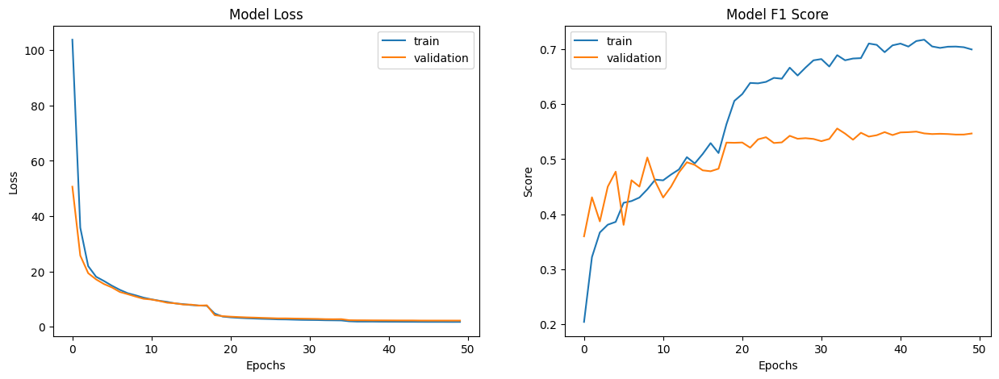

In [ ]:
evaluate_model_train(history_MC)

40/40 ━━━━━━━━━━━━━━━━━━━━ 55s 730ms/step
                     precision    recall  f1-score   support

           adenosis       0.56      0.66      0.61        71
   ductal_carcinoma       0.83      0.61      0.71       553
       fibroadenoma       0.56      0.58      0.57       163
  lobular_carcinoma       0.43      0.71      0.54       100
 mucinous_carcinoma       0.45      0.50      0.47       127
papillary_carcinoma       0.39      0.54      0.45        90
    phyllodes_tumor       0.43      0.35      0.39        71
    tubular_adenoma       0.58      0.73      0.65        91

           accuracy                           0.60      1266
          macro avg       0.53      0.59      0.55      1266
       weighted avg       0.64      0.60      0.61      1266



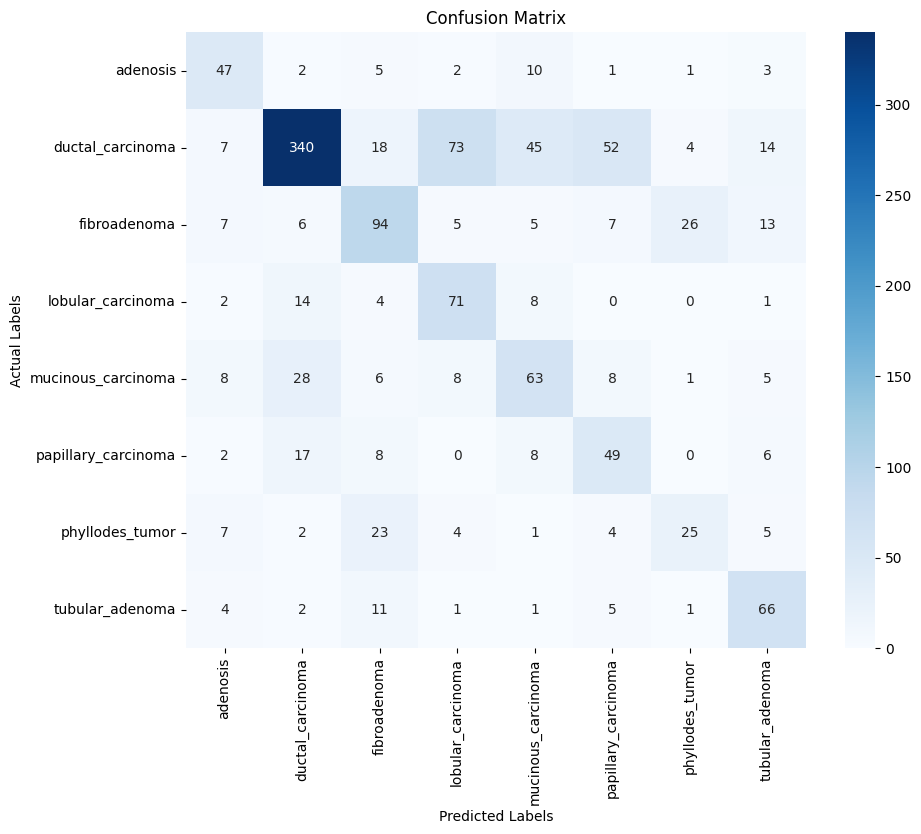

In [ ]:
evaluate_model_predictions(model=model_MC,
                           X_array=val_data_dic_in,
                           y_array_1=y_multiclass_val_hp,
                           y_label_1=y_multiclass_labels,
                           problem_type='single')

With the preprocessing we achieve an F1 score on validation of 0.55. Equal to the best one so far of 0.55 F1 score.

50/50 ━━━━━━━━━━━━━━━━━━━━ 21s 436ms/step
                     precision    recall  f1-score   support

           adenosis       0.49      0.67      0.57        89
   ductal_carcinoma       0.86      0.64      0.73       691
       fibroadenoma       0.62      0.57      0.59       203
  lobular_carcinoma       0.41      0.73      0.53       125
 mucinous_carcinoma       0.54      0.63      0.58       158
papillary_carcinoma       0.41      0.50      0.45       112
    phyllodes_tumor       0.43      0.43      0.43        90
    tubular_adenoma       0.63      0.69      0.66       114

           accuracy                           0.62      1582
          macro avg       0.55      0.61      0.57      1582
       weighted avg       0.67      0.62      0.63      1582



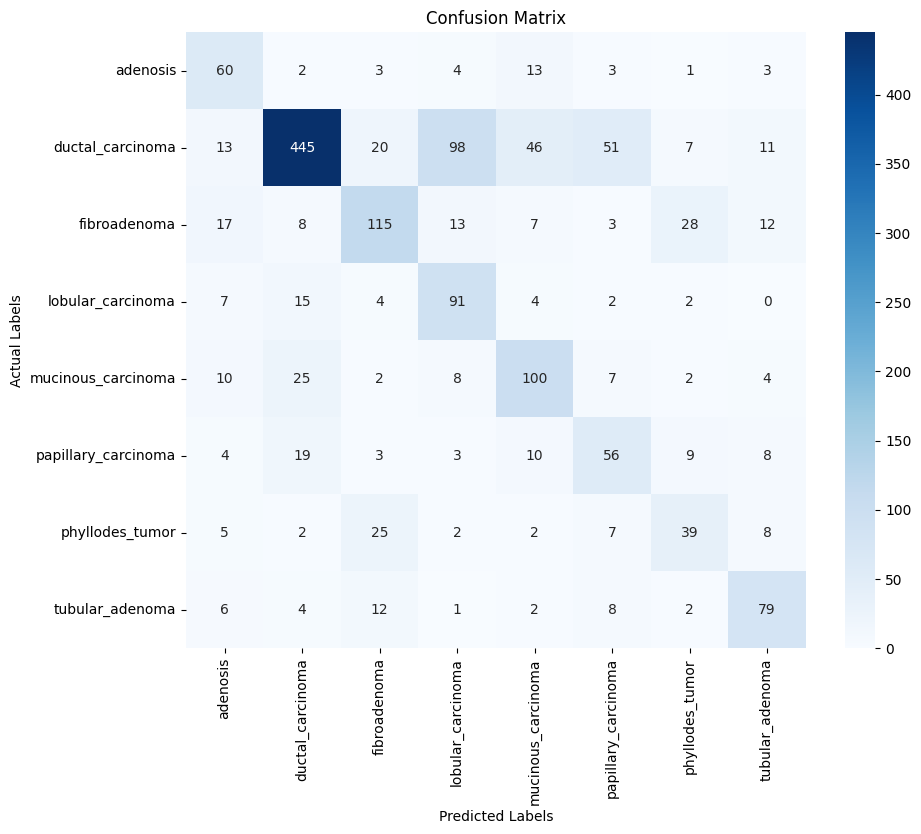

In [ ]:
evaluate_model_predictions(model_MC, X_test_data, y_multiclass_test, y_multiclass_labels, problem_type='single' )

Now on the test set we achieve an F1 score of 0.57. Not passing the best so far of 0.58 F1 score.

## Color Maps

Finally our last test is using different color maps for our images, we will test the original one (RGB), the HSV (Hue-Saturation-Value), and the BGR. Information on the methods as well as their implementation can be found at <a href="https://docs.opencv.org/4.x/d8/d01/group__imgproc__color__conversions.html#ga4e0972be5de079fed4e3a10e24ef5ef0"> Color Conversions OpenCV</a>.

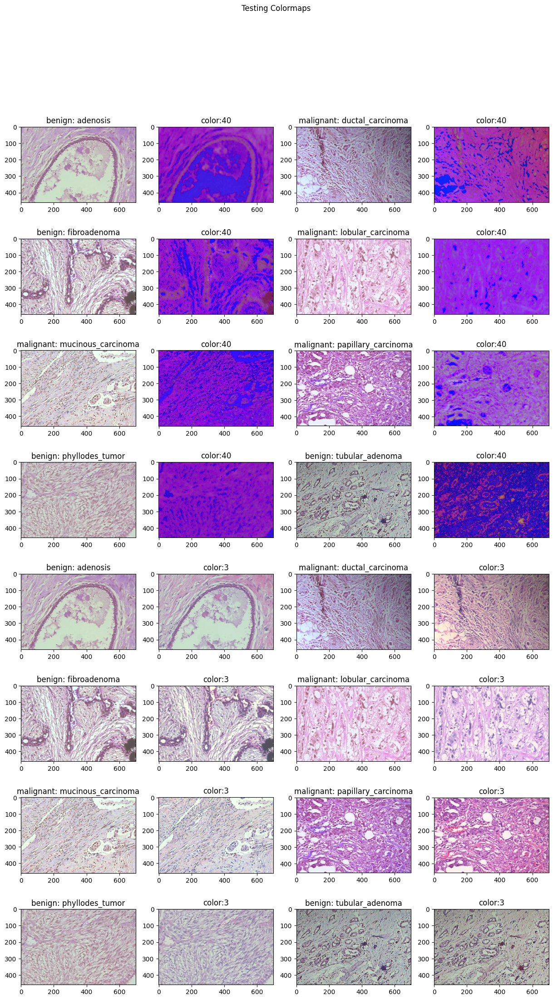

In [38]:
fig, ax = plt.subplots(8,4, figsize=(15, 25))
fig.suptitle('Testing Colormaps')
ax = ax.flatten()
index = 0

for color in [cv2.COLOR_BGR2HSV, cv2.COLOR_RGBA2BGR]:
    for i, img in group.iterrows():
        img_l = cv2.imread(img.path_to_image)
        ax[index].imshow(img_l)
        ax[index].set_title(f'{img['Benign or Malignant']}: {img['Cancer Type']}')
        index+=1
        img_cont = cv2.cvtColor(img_l, color)
        ax[index].imshow(img_cont)
        ax[index].set_title(f'color:{color}')
        index+=1
plt.show()

### Grid Search in Binary Model

We will test it only in the binary model because the multiclass one gives us problems with the memory (the ideal solution was to test both), but in our case we will find a certain configuration using the binary model and see if the results beat our best scores so far.

In [ ]:
param_grid = {'color':[cv2.COLOR_BGR2HSV, None, cv2.COLOR_RGBA2BGR]}

best_params_Bi = None
best_F1_Bi = 0

grid = ParameterGrid(param_grid)
i = 0

for params in tqdm(grid):
    i += 1
    print(f'\nBest Binary val_F1Score so far: {best_F1_Bi}. Parameters: {best_params_Bi}\n')
    print(f'\nTesting: {params}\n')

    X_train = []
    for image in tqdm(X_train_hp_a):

        img = image*255
        if params['color']:
          img = cv2.cvtColor(img, params['color'])
        img = img/255
        X_train.append(img)
    X_train = np.array(X_train, dtype=np.float32)

    X_val = []
    for image in tqdm(X_val_hp_a):

        img = image*255
        if params['color']:
          img = cv2.cvtColor(img, params['color'])
        img = img/255
        X_val.append(img)
    X_val = np.array(X_val, dtype=np.float32)

    # Binary Model
    print('\nBinary Model:')

    early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    LR_ajust = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=2)
    list_callbacks = [early_stop, LR_ajust]

    # Inputs
    input_tensor = Input(shape=shape_input, name='image')
    input_magnitude = Input(shape=shape_mag, name='magnitude')

    # Conv + Pool
    Conv_3_3 = Conv2D(32, (3,3), activation='relu', name='Conv_3x3_1')(input_tensor)
    Conv_3_3 = Conv2D(32, (3,3), activation='relu', name='Conv_3x3_2')(Conv_3_3)

    Pool_2_2 = MaxPooling2D((2,2), name='Pool_2x2')(Conv_3_3)

    # inception modules
    block_1 = inception_module(Pool_2_2, n_f_1x1=64, n_f_3x3_r =16, n_f_3x3=64, n_f_5x5_r=16, n_f_5x5=64, n_f_1x1_end=64, name='IB1')

    Pool2_2_2 = MaxPooling2D((2,2), name='Pool2_2x2')(block_1)

    # Conv + Pool
    Conv2_3_3 = Conv2D(64, (3,3), activation='relu', name='Conv2_3x3_1')(Pool2_2_2)
    Conv2_3_3 = Conv2D(64, (3,3), activation='relu', name='Conv2_3x3_2')(Conv2_3_3)

    Pool3_2_2 = MaxPooling2D((3,3), name='Pool3_2x2')(Conv2_3_3)

    # Flaten bin
    flat = Flatten(name='Flat')(Pool3_2_2)
    flat = concatenate([flat, input_magnitude], axis=1, name='Flat_Bi')

    # Dense Bi
    Bi_dense = Dense(2048, activation='relu', name='Bi_dense0')(flat)
    Bi_dense = Dropout(0.5, name='Bi_dropout0')(Bi_dense)
    Bi_dense = Dense(1024, activation='relu', name='Bi_dense1')(Bi_dense)
    Bi_dense = Dropout(0.5, name='Bi_dropout1')(Bi_dense)
    Bi_dense = Dense(512, activation='relu', name='Bi_dense3')(Bi_dense)
    Bi_dense = Dropout(0.4, name='Bi_dropout3')(Bi_dense)
    Bi_output = Dense(2, activation='softmax', name='Bi_output')(Bi_dense)


    # build de model
    model_Bi = Model([input_tensor,input_magnitude], Bi_output)

    model_Bi.compile(optimizer='adam',
                        loss='categorical_crossentropy',
                        metrics=['F1Score'])

    x_data = {'image' : X_train,
            'magnitude' : Mag_train_hp}

    val_data_dic_in = {'image' : X_val,
                    'magnitude' : Mag_val_hp}

    history_Bi=model_Bi.fit(x_data, y_binary_train_hp, batch_size= 100, epochs=50, callbacks=list_callbacks,
                            validation_data=[val_data_dic_in, y_binary_val_hp], sample_weight=sample_weight_train_hp_Bi)
    Bi_model_F1 = np.max(np.mean(history_Bi.history['val_F1Score'], axis=1))
    if Bi_model_F1 > best_F1_Bi:
        best_F1_Bi = Bi_model_F1
        best_params_Bi = params

    del X_train, X_val , history_Bi , model_Bi

  0%|          | 0/3 [00:00<?, ?it/s]


Best Binary val_F1Score so far: 0. Parameters: None


Testing: {'color': 40}




100%|██████████| 5061/5061 [00:05<00:00, 855.23it/s] 

100%|██████████| 1266/1266 [00:00<00:00, 3937.02it/s]



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 69s 798ms/step - F1Score: 0.4910 - loss: 0.7074 - val_F1Score: 0.6185 - val_loss: 0.7918 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 28s 209ms/step - F1Score: 0.7055 - loss: 0.5417 - val_F1Score: 0.7665 - val_loss: 0.5083 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 212ms/step - F1Score: 0.7656 - loss: 0.4684 - val_F1Score: 0.7705 - val_loss: 0.4845 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 226ms/step - F1Score: 0.7788 - loss: 0.4557 - val_F1Score: 0.7792 - val_loss: 0.4535 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 223ms/step - F1Score: 0.7960 - loss: 0.4240 - val_F1Score: 0.7578 - val_loss: 0.5221 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 212ms/step - F1Score: 0.7956 - loss: 0.4265 - val_F1Score: 0.7914 - val_loss: 0.4288 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - F1Score: 0.8053 - loss: 

 33%|███▎      | 1/3 [05:08<10:17, 308.66s/it]


Best Binary val_F1Score so far: 0.8317495584487915. Parameters: {'color': 40}


Testing: {'color': None}




100%|██████████| 5061/5061 [00:00<00:00, 5256.97it/s]

100%|██████████| 1266/1266 [00:00<00:00, 9281.88it/s]



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 23s 319ms/step - F1Score: 0.4577 - loss: 0.7389 - val_F1Score: 0.7673 - val_loss: 0.6581 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 12s 220ms/step - F1Score: 0.6626 - loss: 0.6264 - val_F1Score: 0.7418 - val_loss: 0.6317 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - F1Score: 0.7112 - loss: 0.5611 - val_F1Score: 0.8170 - val_loss: 0.4325 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 19s 209ms/step - F1Score: 0.7938 - loss: 0.4908 - val_F1Score: 0.8463 - val_loss: 0.4032 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - F1Score: 0.8019 - loss: 0.4708 - val_F1Score: 0.8487 - val_loss: 0.4142 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - F1Score: 0.8063 - loss: 0.4693 - val_F1Score: 0.8527 - val_loss: 0.3700 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 214ms/step - F1Score: 0.7970 - loss: 

 67%|██████▋   | 2/3 [10:19<05:10, 310.04s/it]


Best Binary val_F1Score so far: 0.8803853988647461. Parameters: {'color': None}


Testing: {'color': 3}




100%|██████████| 5061/5061 [00:00<00:00, 5449.14it/s]

100%|██████████| 1266/1266 [00:00<00:00, 4732.83it/s]



Binary Model:
Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 23s 333ms/step - F1Score: 0.5725 - loss: 0.6823 - val_F1Score: 0.8158 - val_loss: 0.4724 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 12s 228ms/step - F1Score: 0.7611 - loss: 0.5238 - val_F1Score: 0.6686 - val_loss: 0.6689 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - F1Score: 0.7436 - loss: 0.5276 - val_F1Score: 0.7154 - val_loss: 0.6537 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 222ms/step - F1Score: 0.7845 - loss: 0.4885 - val_F1Score: 0.8567 - val_loss: 0.3710 - learning_rate: 1.0000e-04
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - F1Score: 0.8176 - loss: 0.4386 - val_F1Score: 0.8606 - val_loss: 0.3545 - learning_rate: 1.0000e-04
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - F1Score: 0.8184 - loss: 0.4361 - val_F1Score: 0.8621 - val_loss: 0.3416 - learning_rate: 1.0000e-04
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 216ms/step - F1Score: 0.8

100%|██████████| 3/3 [22:22<00:00, 447.61s/it]


In [ ]:
print('Binary Model')
print(f'Best F1 score in validation: {best_F1_Bi}')
print(f'Best parameters: {best_params_Bi}')

Binary Model
Best F1 score in validation: 0.9190603494644165
Best parameters: {'color': 3}


In [ ]:
X_train = []
for image in tqdm(X_train_hp_a):
    # denormalize
    img = image*255
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2BGR)
    # normalize
    img = img/255
    X_train.append(img)
X_train_hp_a = np.array(X_train, dtype=np.float32)
del X_train

X_val = []
for image in tqdm(X_val_hp_a):
    # denormalize
    img = image*255
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2BGR)
    # normalize
    img = img/255
    X_val.append(img)
X_val_hp_a = np.array(X_val, dtype=np.float32)
del X_val

100%|██████████| 1266/1266 [00:00<00:00, 3707.98it/s]


In [ ]:
mean_chanel = []
mean_overal = []
median_chanel = []
median_overal = []

for image in tqdm(X_train_hp_a):

    mean_overal.append(np.mean(image))
    median_overal.append(np.median(image))
    mean_chanel.append(np.mean(image, axis= tuple(range(image.ndim-1))))
    median_chanel.append(np.median(image, axis= tuple(range(image.ndim-1))))

mean_overal = np.array(mean_overal)
median_overal = np.array(median_overal)
mean_chanel = np.array(mean_chanel)
median_chanel = np.array(median_chanel)

100%|██████████| 5061/5061 [00:10<00:00, 469.96it/s]


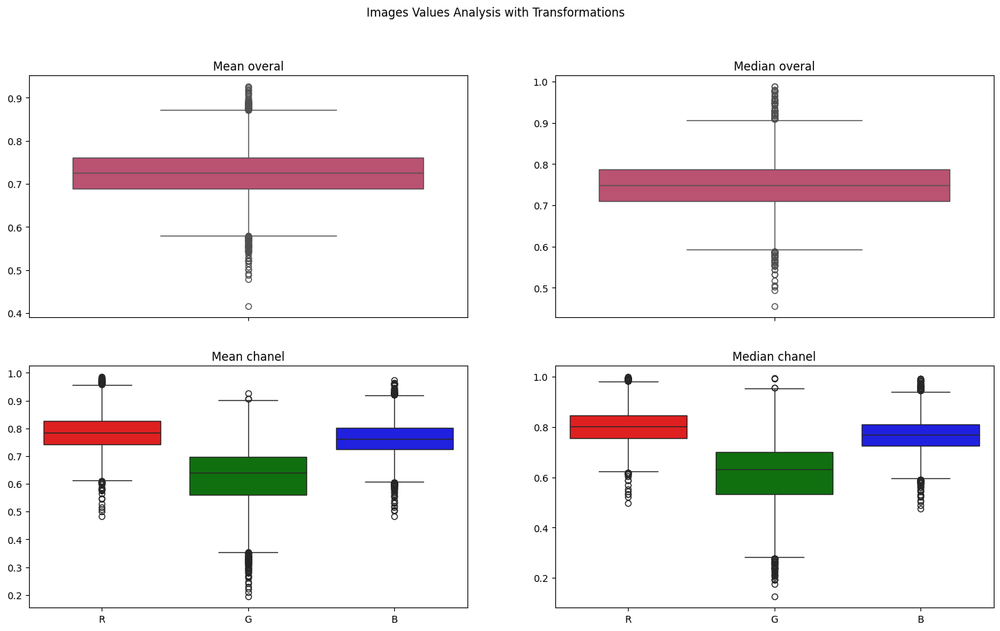

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

fig.suptitle('Images Values Analysis with Transformations')
sns.boxplot(data=mean_overal, ax = axes[0,0], palette=["#cb416b"])
axes[0,0].set_title('Mean overal')
sns.boxplot(data=median_overal, ax = axes[0,1], palette=["#cb416b"])
axes[0,1].set_title('Median overal')
sns.boxplot(data=mean_chanel, ax = axes[1,0], palette=["red","green","blue"])
axes[1,0].set_title('Mean chanel')
axes[1,0].set_xticklabels(['R','G','B'])

sns.boxplot(data=median_chanel,  ax = axes[1,1], palette=["red","green","blue"])
axes[1,1].set_title('Median chanel')
axes[1,1].set_xticklabels(['R','G','B'])

plt.show()

Pixel distribution appears very similar, what is really happening is that the Red and Blue channels are inverted.

#### Binary

Now we will evaluate our binary model with the new preprocessing.

In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
LR_ajust = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=2)
list_callbacks = [early_stop, LR_ajust]

# Inputs
input_tensor = Input(shape=shape_input, name='image')
input_magnitude = Input(shape=shape_mag, name='magnitude')

# Conv + Pool
Conv_3_3 = Conv2D(32, (3,3), activation='relu', name='Conv_3x3_1')(input_tensor)
Conv_3_3 = Conv2D(32, (3,3), activation='relu', name='Conv_3x3_2')(Conv_3_3)

Pool_2_2 = MaxPooling2D((2,2), name='Pool_2x2')(Conv_3_3)

# inception modules
block_1 = inception_module(Pool_2_2, n_f_1x1=64, n_f_3x3_r =16, n_f_3x3=64, n_f_5x5_r=16, n_f_5x5=64, n_f_1x1_end=64, name='IB1')

Pool2_2_2 = MaxPooling2D((2,2), name='Pool2_2x2')(block_1)

# Conv + Pool
Conv2_3_3 = Conv2D(64, (3,3), activation='relu', name='Conv2_3x3_1')(Pool2_2_2)
Conv2_3_3 = Conv2D(64, (3,3), activation='relu', name='Conv2_3x3_2')(Conv2_3_3)

Pool3_2_2 = MaxPooling2D((3,3), name='Pool3_2x2')(Conv2_3_3)

# Flaten bin
flat = Flatten(name='Flat')(Pool3_2_2)
flat = concatenate([flat, input_magnitude], axis=1, name='Flat_Bi')

# Dense Bi
Bi_dense = Dense(2048, activation='relu', name='Bi_dense0')(flat)
Bi_dense = Dropout(0.5, name='Bi_dropout0')(Bi_dense)
Bi_dense = Dense(1024, activation='relu', name='Bi_dense1')(Bi_dense)
Bi_dense = Dropout(0.5, name='Bi_dropout1')(Bi_dense)
Bi_dense = Dense(512, activation='relu', name='Bi_dense3')(Bi_dense)
Bi_dense = Dropout(0.4, name='Bi_dropout3')(Bi_dense)
Bi_output = Dense(2, activation='softmax', name='Bi_output')(Bi_dense)


# build de model
model_Bi = Model([input_tensor,input_magnitude], Bi_output)

model_Bi.compile(optimizer='adam',
                        loss='categorical_crossentropy',
                        metrics=['F1Score'])

x_data = {'image' : X_train_hp_a,
        'magnitude' : Mag_train_hp}

val_data_dic_in = {'image' : X_val_hp_a,
                   'magnitude' : Mag_val_hp}


history_Bi=model_Bi.fit(x_data, y_binary_train_hp, batch_size= 100, epochs=50, callbacks=list_callbacks,
                        validation_data=[val_data_dic_in, y_binary_val_hp], sample_weight=sample_weight_train_hp_Bi)

Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 24s 335ms/step - F1Score: 0.5107 - loss: 0.6968 - val_F1Score: 0.8250 - val_loss: 0.4297 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - F1Score: 0.7715 - loss: 0.5203 - val_F1Score: 0.7998 - val_loss: 0.4759 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - F1Score: 0.7652 - loss: 0.5194 - val_F1Score: 0.6322 - val_loss: 0.6755 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 210ms/step - F1Score: 0.7402 - loss: 0.5111 - val_F1Score: 0.8510 - val_loss: 0.3702 - learning_rate: 1.0000e-04
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - F1Score: 0.8140 - loss: 0.4552 - val_F1Score: 0.8526 - val_loss: 0.3693 - learning_rate: 1.0000e-04
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 209ms/step - F1Score: 0.8154 - loss: 0.4494 - val_F1Score: 0.8609 - val_loss: 0.3570 - learning_rate: 1.0000e-04
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - F1Score: 0.8190 - loss: 0.4

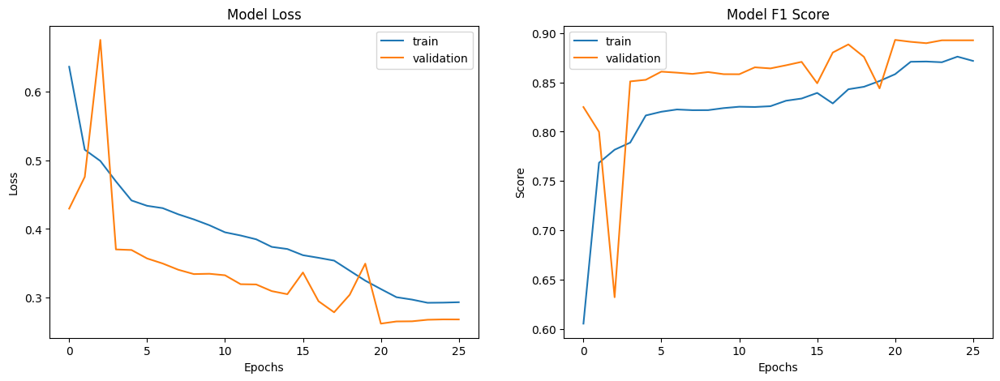

In [ ]:
evaluate_model_train(history_Bi)

40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
              precision    recall  f1-score   support

      benign       0.85      0.86      0.85       396
   malignant       0.94      0.93      0.93       870

    accuracy                           0.91      1266
   macro avg       0.89      0.89      0.89      1266
weighted avg       0.91      0.91      0.91      1266



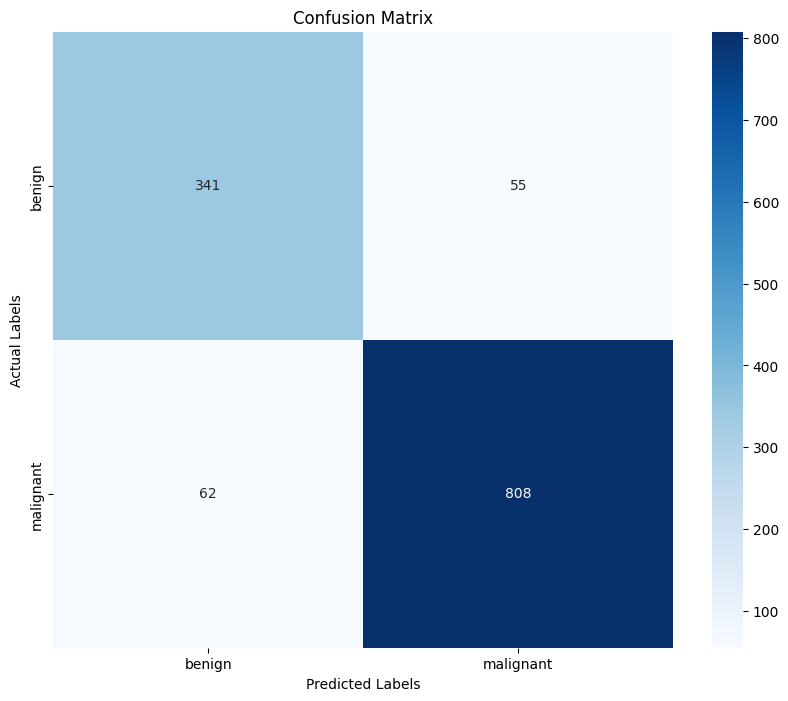

In [ ]:
evaluate_model_predictions(model=model_Bi,
                           X_array=val_data_dic_in,
                           y_array_1=y_binary_val_hp,
                           y_label_1=y_binary_labels,
                           problem_type='single')

With this preprocessing we achieve an F1 score on validation of 0.89. Not passing the best one so far of 0.91 F1 score.

In [ ]:
X_test_data = {"image": X_test_a,
               "magnitude": Mag_test}

50/50 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step
              precision    recall  f1-score   support

      benign       0.81      0.83      0.82       496
   malignant       0.92      0.91      0.92      1086

    accuracy                           0.88      1582
   macro avg       0.86      0.87      0.87      1582
weighted avg       0.89      0.88      0.88      1582



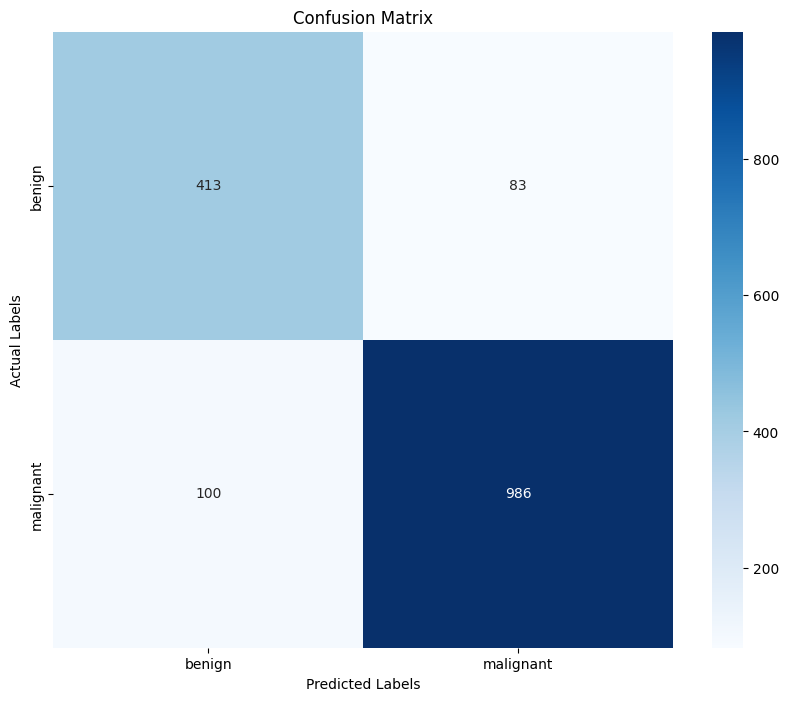

In [ ]:
evaluate_model_predictions(model=model_Bi,
                           X_array=X_test_data,
                           y_array_1=y_binary_test,
                           y_label_1=y_binary_labels,
                           problem_type='single')

Now on the test set, we achieve an F1 score of 0.87. Not passing the best so far of 0.89 F1 score.

#### Multiclass

Now we will evaluate our multiclass model with the new preprocessing.

In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
LR_ajust = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=1)
list_callbacks = [early_stop, LR_ajust]

# Inputs
input_tensor = Input(shape=shape_input, name='image')
input_magnitude = Input(shape=shape_mag, name='magnitude')


# base model
PT_model = DenseNet201(input_tensor=input_tensor, weights='imagenet', include_top=False)

for layer in PT_model.layers[:-5]:
    layer.trainable = False

# Flaten
PT_output = PT_model.output
flat = Flatten(name='Flat')(PT_output)
flat = concatenate([flat, input_magnitude], axis=1, name='Flat_MC')

# Dense
MC_dense = Dropout(0.5, name='MC_dropout0')(flat)
MC_dense = Dense(2048, activation='relu', kernel_regularizer=L1L2(l1 = 0.0005, l2 = 0.0005), name='MC_Dense1')(MC_dense)
MC_dense = Dropout(0.5, name='MC_dropout1')(MC_dense)
MC_dense = Dense(1024, activation='relu', kernel_regularizer=L1L2(l1 = 0.0005, l2 = 0.0005), name='MC_Dense2' )(MC_dense)
MC_dense = Dropout(0.4, name='MC_dropout2')(MC_dense)
MC_output = Dense(8, activation='softmax', name='MC_output')(MC_dense)

# build de model
model_MC = Model([input_tensor,input_magnitude], MC_output)

model_MC.compile(optimizer='adam',
                    loss='categorical_crossentropy',
                    metrics=['F1Score'])


x_data = {'image' : X_train_hp_a,
        'magnitude' : Mag_train_hp}

val_data_dic_in = {'image' : X_val_hp_a,
                   'magnitude' : Mag_val_hp}

history_MC=model_MC.fit(x_data, y_multiclass_train_hp, batch_size= 100, epochs=50, callbacks=list_callbacks,
                        validation_data=[val_data_dic_in, y_multiclass_val_hp], sample_weight=sample_weight_train_hp_MC)

Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - F1Score: 0.1489 - loss: 151.3007 - val_F1Score: 0.2909 - val_loss: 49.7842 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 37s 296ms/step - F1Score: 0.2961 - loss: 41.1512 - val_F1Score: 0.4335 - val_loss: 24.6521 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 296ms/step - F1Score: 0.3385 - loss: 22.8056 - val_F1Score: 0.4566 - val_loss: 18.2612 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 301ms/step - F1Score: 0.3754 - loss: 18.1287 - val_F1Score: 0.4617 - val_loss: 16.6880 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 20s 286ms/step - F1Score: 0.4083 - loss: 16.4633 - val_F1Score: 0.4491 - val_loss: 15.6683 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 15s 290ms/step - F1Score: 0.4192 - loss: 15.4588 - val_F1Score: 0.5111 - val_loss: 14.5051 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 290ms/step - F1Score: 0.4508 - loss: 14.0

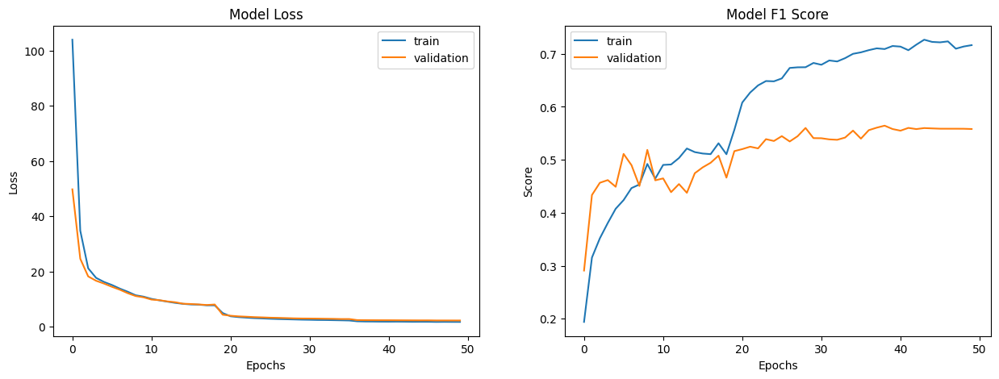

In [ ]:
evaluate_model_train(history_MC)

40/40 ━━━━━━━━━━━━━━━━━━━━ 46s 603ms/step
                     precision    recall  f1-score   support

           adenosis       0.63      0.63      0.63        71
   ductal_carcinoma       0.83      0.58      0.68       553
       fibroadenoma       0.55      0.58      0.56       163
  lobular_carcinoma       0.40      0.72      0.52       100
 mucinous_carcinoma       0.56      0.62      0.59       127
papillary_carcinoma       0.39      0.49      0.43        90
    phyllodes_tumor       0.41      0.48      0.44        71
    tubular_adenoma       0.53      0.70      0.60        91

           accuracy                           0.59      1266
          macro avg       0.54      0.60      0.56      1266
       weighted avg       0.64      0.59      0.60      1266



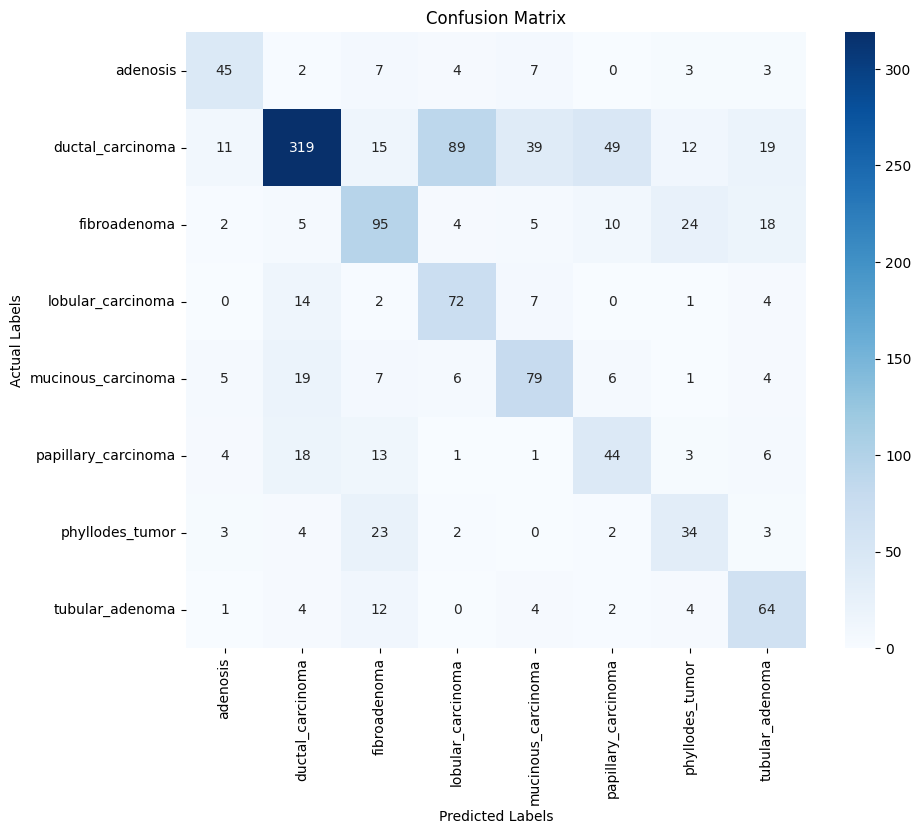

In [ ]:
evaluate_model_predictions(model=model_MC,
                           X_array=val_data_dic_in,
                           y_array_1=y_multiclass_val_hp,
                           y_label_1=y_multiclass_labels,
                           problem_type='single')

With this preprocessing we achieve an F1 score in validation of 0.56. Passing the best one so far of 0.55 F1 score. We will see if it also beats it on the test set.

50/50 ━━━━━━━━━━━━━━━━━━━━ 18s 359ms/step
                     precision    recall  f1-score   support

           adenosis       0.58      0.69      0.63        89
   ductal_carcinoma       0.84      0.61      0.71       691
       fibroadenoma       0.53      0.55      0.54       203
  lobular_carcinoma       0.37      0.67      0.48       125
 mucinous_carcinoma       0.56      0.61      0.59       158
papillary_carcinoma       0.45      0.56      0.50       112
    phyllodes_tumor       0.41      0.48      0.44        90
    tubular_adenoma       0.62      0.63      0.62       114

           accuracy                           0.60      1582
          macro avg       0.54      0.60      0.56      1582
       weighted avg       0.65      0.60      0.62      1582



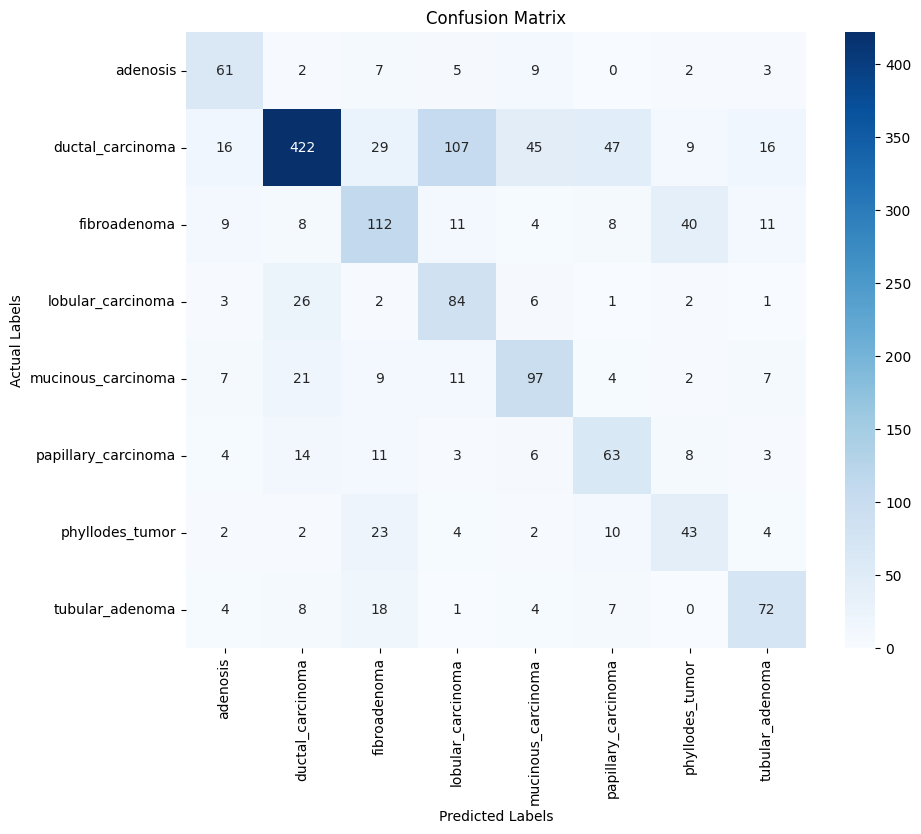

In [ ]:
evaluate_model_predictions(model_MC, X_test_data, y_multiclass_test, y_multiclass_labels, problem_type='single' )

Now on the test set, we achieve an F1 score of 0.56. Not passing the best so far of 0.58 F1 score.

# Final Conclusion

+ Our best preprocessing are the original images with size 150x150.
+ The best binary model is a model built by us, using an inception module (see binary notebook to see the architecture).
+ The best multiclass model is a fine-tuned pre-trained DenseNet201 model (see the multiclass notebook to see the architecture).
+ The best results in F1 score for the validation dataset of these models were: 0.91 in binary and 0.55 in multiclass.
+ The best results in F1 score for the test dataset of these models were: 0.89 in binary and 0.58 in multiclass.
